In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/Tensorflow-Models

Mounted at /content/gdrive
/content/gdrive/.shortcut-targets-by-id/1oP3ewZgiatY88SU5esvVcTCqbdfjYu1d/Tensorflow-Models


In [19]:
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow_datasets as tfds

tfds.disable_progress_bar()

In [22]:
batch_size = 64
auto = tf.data.AUTOTUNE
resize_bigger = 400
num_classes = 5
image_size = 384

def preprocess_dataset(is_training=True):
    def _pp(image, label):
        if is_training:
            # Resize to a bigger spatial resolution and take the random
            # crops.
            image = tf.image.resize(image, (resize_bigger, resize_bigger))
            image = tf.image.random_crop(image, (image_size, image_size, 3))
            image = tf.image.random_flip_left_right(image)
        else:
            image = tf.image.resize(image, (image_size, image_size))
        label = tf.one_hot(label, depth=num_classes)
        return image, label

    return _pp

def prepare_dataset(dataset, is_training=True):
    if is_training:
        dataset = dataset.shuffle(batch_size * 10)
    dataset = dataset.map(preprocess_dataset(is_training), num_parallel_calls=auto)
    return dataset.batch(batch_size).prefetch(auto)

In [23]:
train_dataset, val_dataset = tfds.load(
    "tf_flowers", split=["train[:90%]", "train[90%:]"], as_supervised=True
)

num_train = train_dataset.cardinality()
num_val = val_dataset.cardinality()
print(f"Number of training examples: {num_train}")
print(f"Number of validation examples: {num_val}")

train_dataset = prepare_dataset(train_dataset, is_training=True)
val_dataset = prepare_dataset(val_dataset, is_training=False)

Number of training examples: 3303
Number of validation examples: 367


In [11]:
# Initialize the base model.
# Set the input shape and remove the dense layers.
pre_trained_model = tf.keras.applications.EfficientNetV2S(
    include_top=False, weights='imagenet', input_shape=(384,384,3), pooling='avg'
)

# Freeze the weights of the layers.
for layer in pre_trained_model.layers:
    layer.trainable = False

82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [12]:
pre_trained_model.summary()

Model: "efficientnetv2-s"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 384, 384,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 192, 192,  │        648 │ rescaling_1[0][0] │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 192, 192,  │         96 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 192, 192,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 192, 192,  │      5,184 │ stem_activation[… │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 192, 192,  │         96 │ block1a_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 192, 192,  │          0 │ block1a_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 192, 192,  │          0 │ block1a_project_… │
│                     │ 24)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 192, 192,  │      5,184 │ block1a_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 192, 192,  │         96 │ block1b_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Dropout)           │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 192, 192,  │          0 │ block1b_drop[0][… │
│                     │ 24)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, 96, 96,    │     20,736 │ block1b_add[0][0] │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, 96, 96,    │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, 96, 96,    │          0 │ block2a_expand_b

 Total params: 20,331,360 (77.56 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,331,360 (77.56 MB)

In [15]:
# Choose a layer as the last layer of your base model (e.g., one of the later convolutional layers)
last_layer = pre_trained_model.get_layer('block6o_project_conv')
print('last layer output shape: ', last_layer.output.shape)
last_output = last_layer.output

last layer output shape:  (None, 12, 12, 256)


In [21]:
# Flatten the output layer to 1 dimension
x = tf.keras.layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = tf.keras.layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = tf.keras.layers.Dropout(0.2)(x)
# Add a final layer for classification
x = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

# Append the dense network to the base model
model = tf.keras.Model(pre_trained_model.input, x)

# Print the model summary. See your dense network connected at the end.
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 384, 384,  │          0 │ input_layer_3[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 192, 192,  │        648 │ rescaling_1[0][0] │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 192, 192,  │         96 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 192, 192,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 192, 192,  │      5,184 │ stem_activation[… │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 192, 192,  │         96 │ block1a_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 192, 192,  │          0 │ block1a_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_add (Add)   │ (None, 192, 192,  │          0 │ block1a_project_… │
│                     │ 24)               │            │ stem_activation[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 192, 192,  │      5,184 │ block1a_add[0][0] │
│ (Conv2D)            │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 192, 192,  │         96 │ block1b_project_… │
│ (BatchNormalizatio… │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Dropout)           │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 192, 192,  │          0 │ block1b_drop[0][… │
│                     │ 24)               │            │ block1a_add[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, 96, 96,    │     20,736 │ block1b_add[0][0] │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, 96, 96,    │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, 96, 96,    │          0 │ block2a_expand_b

 Total params: 57,752,421 (220.31 MB)

 Trainable params: 37,754,885 (144.02 MB)

 Non-trainable params: 19,997,536 (76.28 MB)

In [24]:
# Create a model with data augmentation layers
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.4),
    tf.keras.layers.RandomTranslation(0.2,0.2),
    tf.keras.layers.RandomContrast(0.4),
    tf.keras.layers.RandomZoom(0.2),
    ])

In [32]:
# Attach the data augmentation model to the base model
inputs = tf.keras.Input(shape=(384,384,3))
x = data_augmentation(inputs)
x = model(x)

model_with_aug = tf.keras.Model(inputs, x)

In [33]:
# Set the training parameters
model_with_aug.compile(
  optimizer=tf.keras.optimizers.SGD(learning_rate=0.005, momentum=0.9),
  loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
  metrics=['accuracy'])

In [34]:
EPOCHS = 15

# When using `save_weights_only=True` in `ModelCheckpoint`, the filepath provided must end in `.weights.h5`
checkpoint_filepath = "efficientnet_checkpoint.weights.h5"
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    checkpoint_filepath,
    monitor="val_accuracy",
    save_best_only=True,
    save_weights_only=True,
)

# Train the model.
history = model_with_aug.fit(
    train_dataset,
    validation_data = val_dataset,
    epochs = EPOCHS,
    callbacks=[checkpoint_callback],
    verbose = 2)

Epoch 1/15
52/52 - 82s - 2s/step - accuracy: 0.8435 - loss: 0.7291 - val_accuracy: 0.8638 - val_loss: 0.7065
Epoch 2/15
52/52 - 76s - 1s/step - accuracy: 0.8480 - loss: 0.7254 - val_accuracy: 0.8747 - val_loss: 0.6867
Epoch 3/15
52/52 - 81s - 2s/step - accuracy: 0.8607 - loss: 0.7063 - val_accuracy: 0.8801 - val_loss: 0.6830
Epoch 4/15
52/52 - 75s - 1s/step - accuracy: 0.8550 - loss: 0.7152 - val_accuracy: 0.8747 - val_loss: 0.6732
Epoch 5/15
52/52 - 82s - 2s/step - accuracy: 0.8601 - loss: 0.6990 - val_accuracy: 0.8638 - val_loss: 0.6719
Epoch 6/15
52/52 - 82s - 2s/step - accuracy: 0.8744 - loss: 0.6799 - val_accuracy: 0.8719 - val_loss: 0.6671
Epoch 7/15
52/52 - 90s - 2s/step - accuracy: 0.8622 - loss: 0.6913 - val_accuracy: 0.8828 - val_loss: 0.6721
Epoch 8/15
52/52 - 73s - 1s/step - accuracy: 0.8747 - loss: 0.6823 - val_accuracy: 0.8610 - val_loss: 0.6765
Epoch 9/15
52/52 - 82s - 2s/step - accuracy: 0.8741 - loss: 0.6717 - val_accuracy: 0.8665 - val_loss: 0.6504
Epoch 10/15
52/52 -

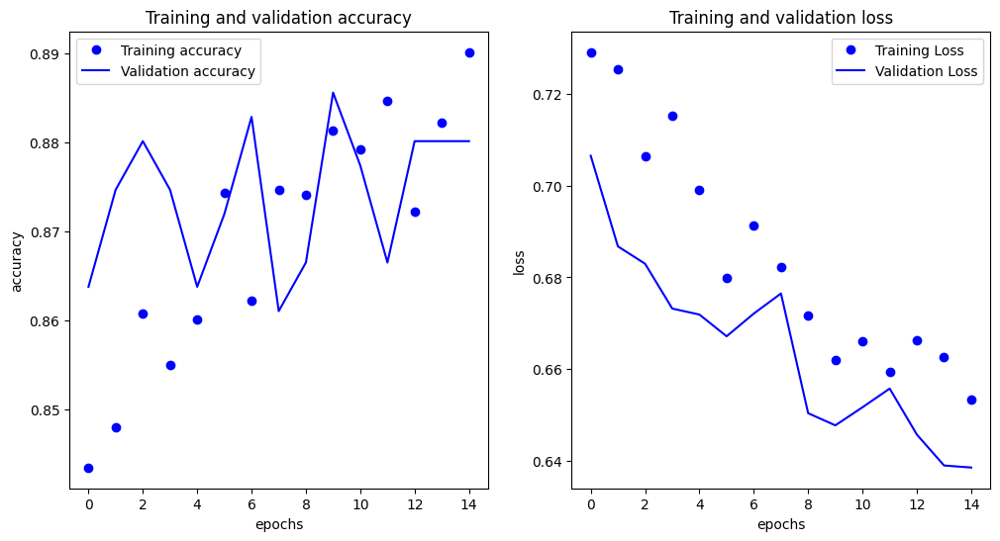

In [35]:
def plot_loss_acc(history):
    '''Plots the training and validation loss and accuracy from a history object'''
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    fig, ax = plt.subplots(1,2, figsize=(12, 6))
    ax[0].plot(epochs, acc, 'bo', label='Training accuracy')
    ax[0].plot(epochs, val_acc, 'b', label='Validation accuracy')
    ax[0].set_title('Training and validation accuracy')
    ax[0].set_xlabel('epochs')
    ax[0].set_ylabel('accuracy')
    ax[0].legend()

    ax[1].plot(epochs, loss, 'bo', label='Training Loss')
    ax[1].plot(epochs, val_loss, 'b', label='Validation Loss')
    ax[1].set_title('Training and validation loss')
    ax[1].set_xlabel('epochs')
    ax[1].set_ylabel('loss')
    ax[1].legend()

    plt.show()

plot_loss_acc(history)

In [36]:
model_with_aug.load_weights(checkpoint_filepath)
_, accuracy = model_with_aug.evaluate(val_dataset)
print(f"Validation accuracy: {round(accuracy * 100, 2)}%")

6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 702ms/step - accuracy: 0.8734 - loss: 0.6683
Validation accuracy: 88.56%


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


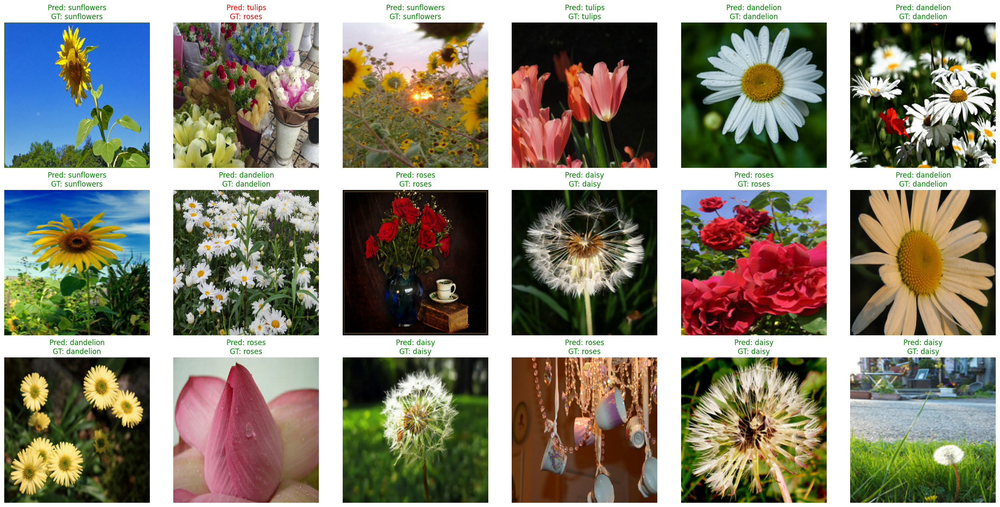

In [58]:
import tensorflow as tf
import numpy as np
import random
import matplotlib.pyplot as plt

# Class names for tf_flowers dataset
class_names = ["daisy", "dandelion", "tulips", "sunflowers", "roses"]

# Number of samples to visualize
N = 18
cols = 6
rows = int(np.ceil(N / cols))

plt.figure(figsize=(4 * cols, 4 * rows))

# Collect all validation images and labels into lists
val_images, val_labels = [], []
for img, label in val_dataset.unbatch():
    val_images.append(img.numpy())
    val_labels.append(label.numpy())

val_images = np.array(val_images)
val_labels = np.array(val_labels)

# Pick N random indices
rand_indices = np.random.choice(len(val_images), N, replace=False)

# Get predictions for the randomly picked images
images_to_show = val_images[rand_indices]
labels_to_show = val_labels[rand_indices]
predictions = model_with_aug.predict(images_to_show)

# Plot
for plot_idx in range(N):
    img = images_to_show[plot_idx]
    true_class = np.argmax(labels_to_show[plot_idx])
    pred_class = np.argmax(predictions[plot_idx])

    plt.subplot(rows, cols, plot_idx + 1)
    plt.imshow(img.astype("uint8"))
    plt.title(f"Pred: {class_names[pred_class]}\nGT: {class_names[true_class]}",
              color="green" if pred_class == true_class else "red")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [53]:
# Serialize the model as a SavedModel.
# Use model.export for Keras models
model_with_aug.export("efficientnet_checkpoint")

# Convert to TFLite. This form of quantization is called
# post-training dynamic-range quantization in TFLite.
converter = tf.lite.TFLiteConverter.from_saved_model("efficientnet_checkpoint")
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,  # Enable TensorFlow Lite ops.
    tf.lite.OpsSet.SELECT_TF_OPS,  # Enable TensorFlow ops.
]
tflite_model = converter.convert()
open("efficientnet_checkpoint.tflite", "wb").write(tflite_model)

Saved artifact at 'efficientnet_checkpoint'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 384, 384, 3), dtype=tf.float32, name='keras_tensor_539')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  140392442633040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140395105482704: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140392279952848: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140392279956688: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140392279956112: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140392556935696: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140392466317584: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140392466318544: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140395105111120: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140395105112080: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140

59524864

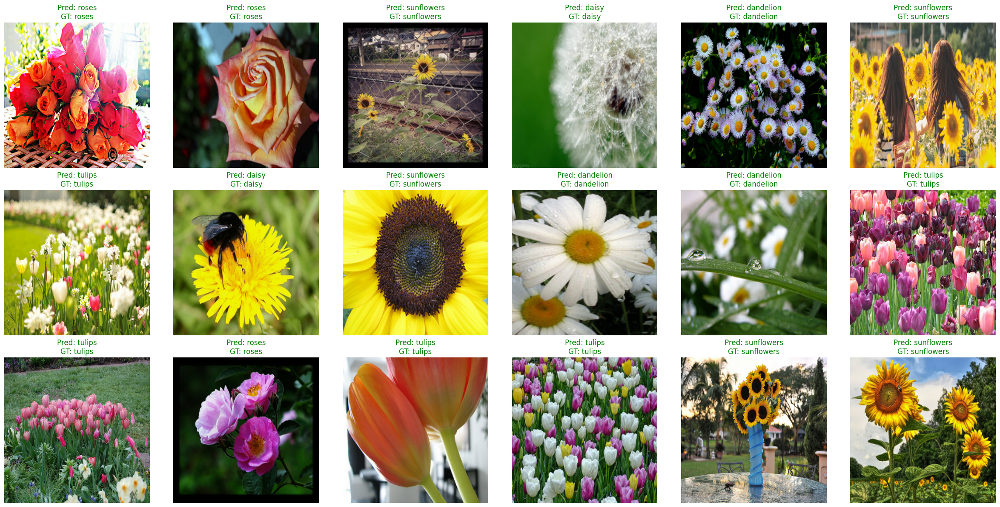

In [59]:
import tensorflow as tf
import numpy as np
import random
import matplotlib.pyplot as plt

# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="efficientnet_checkpoint.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Class names for tf_flowers dataset
class_names = ["daisy", "dandelion", "tulips", "sunflowers", "roses"]

# Number of samples to visualize
N = 18
cols = 6
rows = int(np.ceil(N / cols))

plt.figure(figsize=(4 * cols, 4 * rows))

# Collect all validation images and labels into lists
val_images, val_labels = [], []
for img, label in val_dataset.unbatch():
    val_images.append(img.numpy())
    val_labels.append(label.numpy())

val_images = np.array(val_images)
val_labels = np.array(val_labels)

# Pick N random indices
rand_indices = np.random.choice(len(val_images), N, replace=False)

images_to_show = val_images[rand_indices]
labels_to_show = val_labels[rand_indices]

# Run inference with TFLite
predictions = []
for img in images_to_show:
    # Add batch dimension and convert dtype if required
    input_data = np.expand_dims(img, axis=0).astype(input_details[0]['dtype'])

    # Set the input tensor
    interpreter.set_tensor(input_details[0]['index'], input_data)

    # Run inference
    interpreter.invoke()

    # Get output tensor
    output_data = interpreter.get_tensor(output_details[0]['index'])
    predictions.append(output_data[0])

predictions = np.array(predictions)

# Plot results
for plot_idx in range(N):
    img = images_to_show[plot_idx]
    true_class = np.argmax(labels_to_show[plot_idx])
    pred_class = np.argmax(predictions[plot_idx])

    plt.subplot(rows, cols, plot_idx + 1)
    plt.imshow(img.astype("uint8"))
    plt.title(f"Pred: {class_names[pred_class]}\nGT: {class_names[true_class]}",
              color="green" if pred_class == true_class else "red")
    plt.axis("off")

plt.tight_layout()
plt.show()

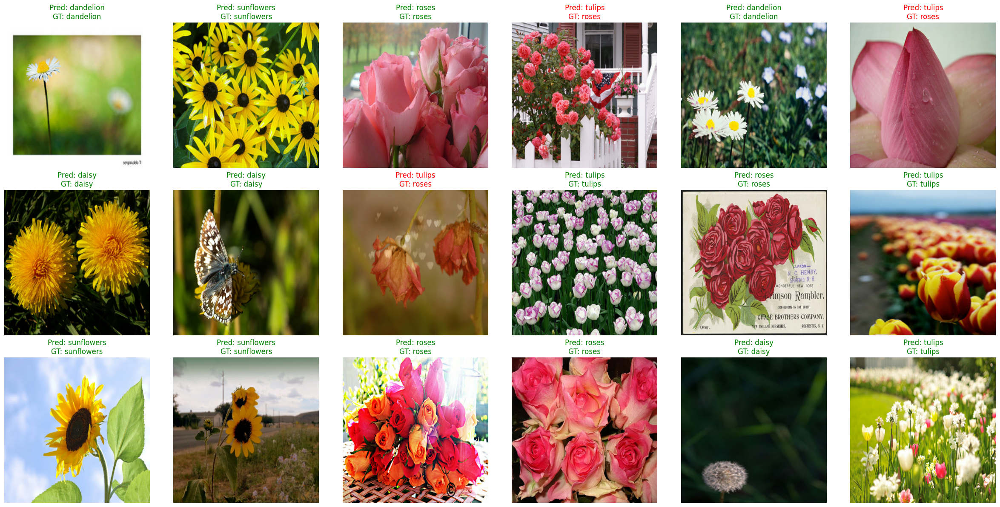

In [60]:
import tensorflow as tf
import numpy as np
import random
import matplotlib.pyplot as plt

# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="efficientnet_checkpoint.tflite")
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Class names for tf_flowers dataset
class_names = ["daisy", "dandelion", "tulips", "sunflowers", "roses"]

# Number of samples to visualize
N = 18
cols = 6
rows = int(np.ceil(N / cols))

plt.figure(figsize=(4 * cols, 4 * rows))

# Collect all validation images and labels into lists
val_images, val_labels = [], []
for img, label in val_dataset.unbatch():
    val_images.append(img.numpy())
    val_labels.append(label.numpy())

val_images = np.array(val_images)
val_labels = np.array(val_labels)

# Pick N random indices
rand_indices = np.random.choice(len(val_images), N, replace=False)

images_to_show = val_images[rand_indices]
labels_to_show = val_labels[rand_indices]

# Run inference with TFLite
predictions = []
for img in images_to_show:
    # Add batch dimension and convert dtype if required
    input_data = np.expand_dims(img, axis=0).astype(input_details[0]['dtype'])

    # Set the input tensor
    interpreter.set_tensor(input_details[0]['index'], input_data)

    # Run inference
    interpreter.invoke()

    # Get output tensor
    output_data = interpreter.get_tensor(output_details[0]['index'])
    predictions.append(output_data[0])

predictions = np.array(predictions)

# Plot results
for plot_idx in range(N):
    img = images_to_show[plot_idx]
    true_class = np.argmax(labels_to_show[plot_idx])
    pred_class = np.argmax(predictions[plot_idx])

    plt.subplot(rows, cols, plot_idx + 1)
    plt.imshow(img.astype("uint8"))
    plt.title(f"Pred: {class_names[pred_class]}\nGT: {class_names[true_class]}",
              color="green" if pred_class == true_class else "red")
    plt.axis("off")

plt.tight_layout()
plt.show()